# This notebook trains a visual content recognition model on *Beyond Words* bounding box annotations (plus additional headline + advertisement annotations). 

*Benjamin Charles Germain Lee*
(LOC Innovator-in-Residence)

This notebook finetunes a pre-trained object detection model (Faster-RCNN R50-FPN) to predict bounding boxes around photographs, illustrations, maps, comics, editorial cartoons, headlines, and annotations in historical newspaper images.  The notebook is described in more detail in the newspaper-navigator repo.

This notebook makes the following assumptions:

- The newspaper-navigator repo has been cloned, so the local file structure is intact.
- Detectron2 has been installed.  For Amazon EC2 instances with a Deep Learning Ubuntu AMI, the bash script for installing detectron2 (install-detectron2.sh) can be run to handle the installation (see the repo for more info).

This notebook is based on the following notebook:

- https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5


# First, we handle imports and data formatting.

This cell imports libraries and constructs a COCO instance using the training and validation JSON files; essentially, this enables the model to handle the data loading using the COCO standard:

In [1]:
# to display images inline
%matplotlib inline

# import some common libraries
import cv2
import random
import glob
import os
import shutil
import json
import math
import numpy as np
import matplotlib.pyplot as plt

# import detectron2, etc.
import detectron2
from detectron2.config import get_cfg
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.engine import DefaultPredictor
from detectron2.evaluation import COCOEvaluator
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.logger import setup_logger
setup_logger()

# cd into the beyond words dataset
os.chdir("../beyond_words_data")

# we now register the dataset
register_coco_instances("beyond_words_train", {}, "train_80_percent.json", "images")
register_coco_instances("beyond_words_val", {}, "val_20_percent.json", "images")
register_coco_instances("beyond_words_combined", {}, "trainval.json", "images")

# Next, we visualize some examples.

This cell visualizes some examples from the training set:

WARNING [03/21 22:26:58 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 22:26:58 d2.data.datasets.coco]: Loaded 2846 images in COCO format from train_80_percent.json
images/1978.jpg
images/2164.jpg
images/199.jpg
images/1324.jpg
images/2612.jpg


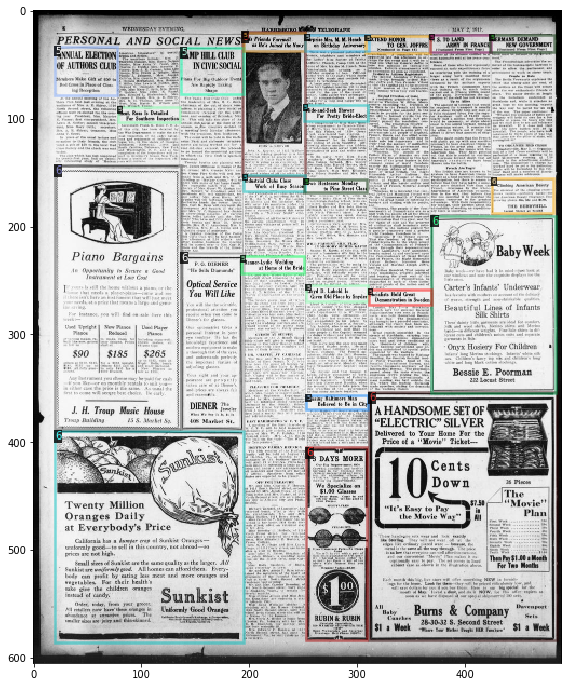

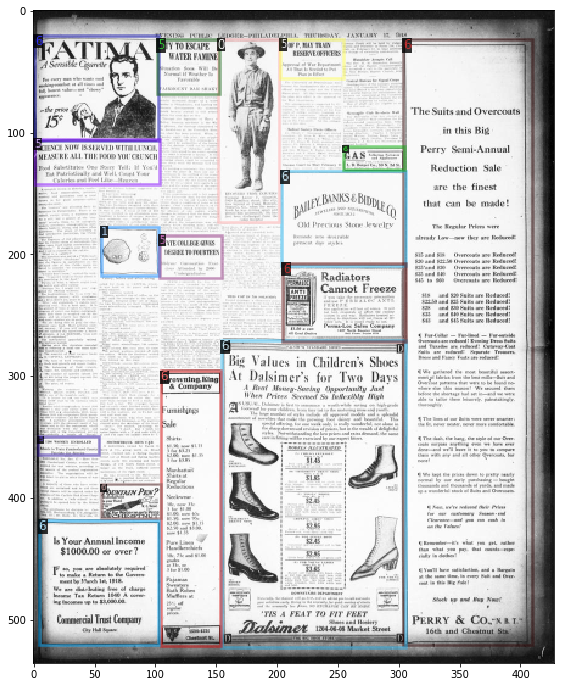

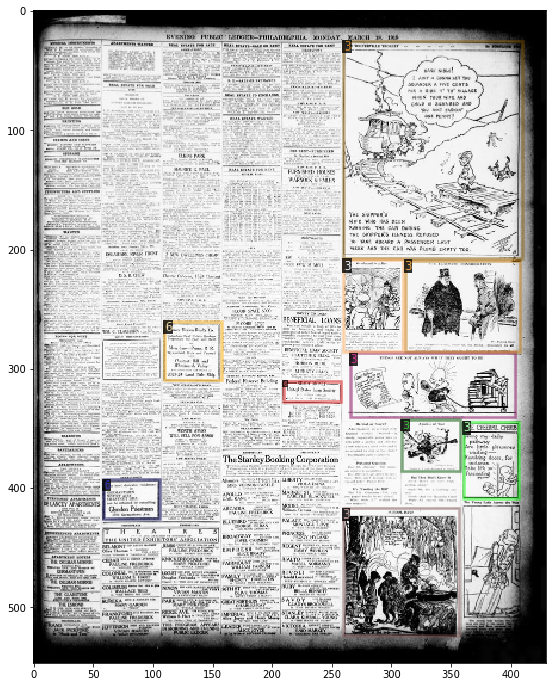

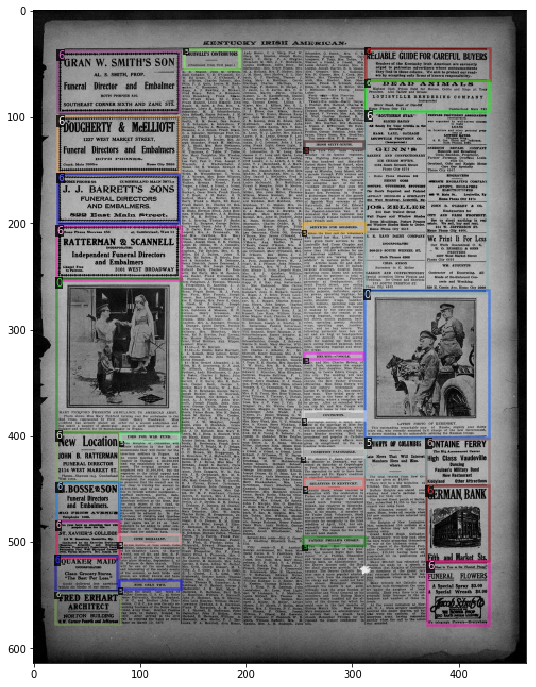

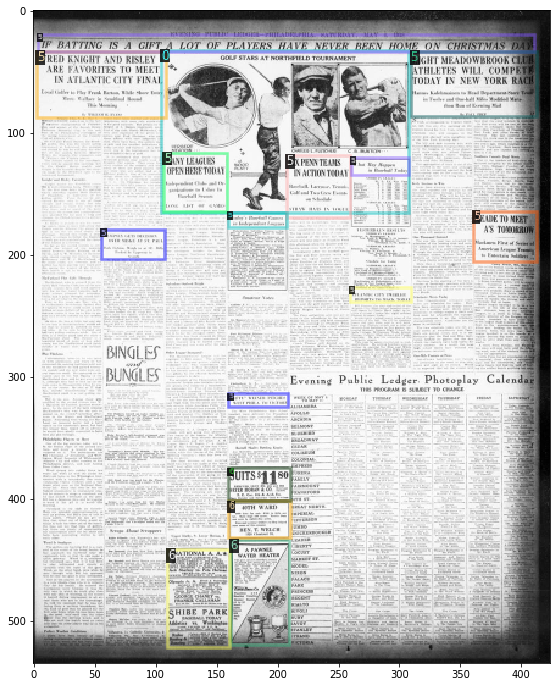

In [2]:
# sets random seed for reproducibility
random.seed(0)

dataset_dicts = DatasetCatalog.get("beyond_words_train")
my_metadata = MetadataCatalog.get("beyond_words_val")

n_examples_to_display = 5
for d in random.sample(dataset_dicts, n_examples_to_display):
    print(d["file_name"])
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_metadata, scale=0.5)
    v = visualizer.draw_dataset_dict(d)
    plt.figure(figsize=(15,12))
    plt.imshow(v.get_image()[:, :, ::-1])


# Next, we finetune the Faster-RCNN implementation from Detectron2's Model Zoo.

We can pick our choice of pre-trained model here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines.

The 7 classes of visual content are:

- Photograph
- Illustration
- Map
- Comics/Cartoon
- Editorial Cartoon
- Headline
- Advertisement

Below, we finetune "Faster_rcnn_R_50_FPN_3x" and evaluate mean average precision on the held-out data (80%-20% train-val split); for this demo we run for 10 epochs - feel free to run for more epochs and watch the performance on the validation set improve!

Note that there are lines of code below (currently commented out) for saving intermediate model weights and predictions on the validation set to an S3 bucket for later analysis.


In [3]:
# sets batch size
batch_size = 16
# sets epoch size accordingly (to convert iterations to epochs)
epoch = math.ceil(2748/float(batch_size))
# sets total number of epochs to train for
epoch_num = 10

cfg = get_cfg()
# loads in correct pre-trained model parameters
cfg.merge_from_file("../..//detectron2/configs/COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
# loads pre-trained model weights (from Model Zoo)
cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl"
# loads in training/val data using the registered COCO instance
cfg.DATASETS.TRAIN = ("beyond_words_train",)
cfg.DATASETS.TEST = ("beyond_words_val",)
# sets number of object classes
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 7

# makes output directory for weights, etc.
os.makedirs("../model_weights/", exist_ok=True)

# sets output directory for model weights, checkpoints, etc.
cfg.OUTPUT_DIR = '../model_weights/'

# some hyperparameters
cfg.SOLVER.BASE_LR = 0.00025
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.SOLVER.MAX_ITER = epoch
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 8

print("EPOCH 1")

# trains for one epoch
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)  #change here if resuming
trainer.train()

######## FOR SAVING MODEL WEIGHTS AFTER EACH EPOCH TO AN S3 BUCKET #########
# with open("../model_weights/model_final.pth", "rb") as f:
#     s3.upload_fileobj(f, "BUCKET-NAME-HERE", "new_val_model_weights/model_epoch_1.pth")
############################################################################

# evaluates on validation data after one epoch
# metrics are printed out to console
trainer.test(trainer.cfg, trainer.model, COCOEvaluator("beyond_words_val", trainer.cfg, False, trainer.cfg.OUTPUT_DIR))

######## FOR SAVING PREDICTIONS ON VALIDATION SET AFTER EACH EPOCH TO AN S3 BUCKET ########
# with open("../model_weights/coco_instances_results.json", "rb") as f:
#     s3.upload_fileobj(f, "BUCKET-NAME-HERE", "new_val_model_weights/coco_results_epoch_1.json")
###########################################################################################

# trains then evaluates on validation data iteratively for desired number of epochs
for i in range(0, epoch_num-1):
    
    print("EPOCH " + str(i+2))

    # trains again
    cfg.SOLVER.MAX_ITER = epoch*(i+2)
    trainer = DefaultTrainer(cfg) 
    trainer.resume_or_load(resume=True)
    trainer.train()
    
    ######## FOR SAVING MODEL WEIGHTS AFTER EACH EPOCH TO AN S3 BUCKET #########
#     with open("../model_weights/model_final.pth", "rb") as f:
#         s3.upload_fileobj(f, "BUCKET-NAME-HERE", "new_val_model_weights/model_eopch_" + str(i+2) + ".pth")
    ############################################################################   
    
    trainer.test(trainer.cfg, trainer.model, COCOEvaluator("beyond_words_val", trainer.cfg, False, trainer.cfg.OUTPUT_DIR))

    ######## FOR SAVING PREDICTIONS ON VALIDATION SET AFTER EACH EPOCH TO AN S3 BUCKET ########
#     with open("../model_weights/coco_instances_results.json", "rb") as f:
#         s3.upload_fileobj(f, "BUCKET-NAME-HERE", "new_val_model_weights/coco_results_epoch_" + str(i+2) + ".json")
    ###########################################################################################

EPOCH 1
[03/21 22:27:06 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
  

WARNING [03/21 22:27:06 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 22:27:06 d2.data.datasets.coco]: Loaded 2846 images in COCO format from train_80_percent.json
[03/21 22:27:06 d2.data.build]: Removed 1 images with no usable annotations. 2845 images left.
[03/21 22:27:06 d2.data.build]: Distribution of instances among all 7 categories:
|   category    | #instances   |   category    | #instances   |  category  | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:----------:|:-------------|
|  Photograph   | 3375         | Illustration  | 842          |    Map     | 181          |
| Comics/Cart.. | 939          | Editorial C.. | 239          |  Headline  | 22179        |
| Advertisement | 10723        |               |              |            |              |
|     total     | 38478        |               |              |            |              |
[03/21 22:27:06 d2.data.detectio

'roi_heads.box_predictor.cls_score.weight' has shape (81, 1024) in the checkpoint but (8, 1024) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (8,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 1024) in the checkpoint but (28, 1024) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (28,) in the model! Skipped.


[03/21 22:27:06 d2.engine.train_loop]: Starting training from iteration 0
[03/21 22:27:40 d2.utils.events]: eta: 0:04:19  iter: 19  total_loss: 4.904  loss_cls: 2.131  loss_box_reg: 0.635  loss_rpn_cls: 1.974  loss_rpn_loc: 0.236  time: 1.7151  data_time: 0.1588  lr: 0.000005  max_mem: 8782M
[03/21 22:28:15 d2.utils.events]: eta: 0:03:50  iter: 39  total_loss: 3.978  loss_cls: 2.008  loss_box_reg: 0.681  loss_rpn_cls: 1.089  loss_rpn_loc: 0.192  time: 1.7372  data_time: 0.1431  lr: 0.000010  max_mem: 8782M
[03/21 22:28:52 d2.utils.events]: eta: 0:03:20  iter: 59  total_loss: 3.144  loss_cls: 1.829  loss_box_reg: 0.724  loss_rpn_cls: 0.450  loss_rpn_loc: 0.144  time: 1.7760  data_time: 0.1438  lr: 0.000015  max_mem: 8994M
[03/21 22:29:28 d2.utils.events]: eta: 0:02:45  iter: 79  total_loss: 2.699  loss_cls: 1.607  loss_box_reg: 0.761  loss_rpn_cls: 0.193  loss_rpn_loc: 0.144  time: 1.7790  data_time: 0.1380  lr: 0.000020  max_mem: 8994M
[03/21 22:30:05 d2.utils.events]: eta: 0:02:10  it

[03/21 22:34:08 d2.evaluation.testing]: copypaste: 0.3089,1.0350,0.0886,0.0000,0.6079,0.3546
EPOCH 2
[03/21 22:34:08 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bi

WARNING [03/21 22:34:09 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 22:34:09 d2.data.datasets.coco]: Loaded 2846 images in COCO format from train_80_percent.json
[03/21 22:34:09 d2.data.build]: Removed 1 images with no usable annotations. 2845 images left.
[03/21 22:34:09 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[03/21 22:34:09 d2.data.build]: Using training sampler TrainingSampler
[03/21 22:34:09 d2.engine.train_loop]: Starting training from iteration 172
[03/21 22:34:24 d2.utils.events]: eta: 0:05:16  iter: 179  total_loss: 1.901  loss_cls: 0.877  loss_box_reg: 0.768  loss_rpn_cls: 0.121  loss_rpn_loc: 0.136  time: 1.9129  data_time: 0.1745  lr: 0.000045  max_mem: 8994M
[03/21 22:35:03 d2.utils.events]: eta: 0:04:43  iter: 199  total_loss: 1.879  loss_cls: 0.838  loss_bo

[03/21 22:41:32 d2.engine.defaults]: Evaluation results for beyond_words_val in csv format:
[03/21 22:41:32 d2.evaluation.testing]: copypaste: Task: bbox
[03/21 22:41:32 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[03/21 22:41:32 d2.evaluation.testing]: copypaste: 6.6903,13.2107,5.7927,0.0000,4.1588,7.5002
EPOCH 3
[03/21 22:41:32 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, k

WARNING [03/21 22:41:32 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 22:41:32 d2.data.datasets.coco]: Loaded 2846 images in COCO format from train_80_percent.json
[03/21 22:41:32 d2.data.build]: Removed 1 images with no usable annotations. 2845 images left.
[03/21 22:41:32 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[03/21 22:41:32 d2.data.build]: Using training sampler TrainingSampler
[03/21 22:41:33 d2.engine.train_loop]: Starting training from iteration 344
[03/21 22:42:03 d2.utils.events]: eta: 0:04:58  iter: 359  total_loss: 1.649  loss_cls: 0.637  loss_box_reg: 0.810  loss_rpn_cls: 0.068  loss_rpn_loc: 0.096  time: 1.8950  data_time: 0.1634  lr: 0.000090  max_mem: 8994M
[03/21 22:42:43 d2.utils.events]: eta: 0:04:31  iter: 379  total_loss: 1.585  loss_cls: 0.614  loss_bo

[03/21 22:48:57 d2.evaluation.testing]: copypaste: 13.7714,25.0397,12.8240,0.0000,13.6257,15.1856
EPOCH 4
[03/21 22:48:57 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3

WARNING [03/21 22:48:57 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 22:48:57 d2.data.datasets.coco]: Loaded 2846 images in COCO format from train_80_percent.json
[03/21 22:48:58 d2.data.build]: Removed 1 images with no usable annotations. 2845 images left.
[03/21 22:48:58 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[03/21 22:48:58 d2.data.build]: Using training sampler TrainingSampler
[03/21 22:48:58 d2.engine.train_loop]: Starting training from iteration 516
[03/21 22:49:05 d2.utils.events]: eta: 0:05:41  iter: 519  total_loss: 1.180  loss_cls: 0.443  loss_box_reg: 0.588  loss_rpn_cls: 0.050  loss_rpn_loc: 0.126  time: 2.0185  data_time: 0.2320  lr: 0.000130  max_mem: 9208M
[03/21 22:49:45 d2.utils.events]: eta: 0:04:58  iter: 539  total_loss: 1.267  loss_cls: 0.497  loss_bo

[03/21 22:56:20 d2.engine.defaults]: Evaluation results for beyond_words_val in csv format:
[03/21 22:56:20 d2.evaluation.testing]: copypaste: Task: bbox
[03/21 22:56:20 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[03/21 22:56:20 d2.evaluation.testing]: copypaste: 20.9093,34.1272,21.8907,0.0828,22.2850,22.4743
EPOCH 5
[03/21 22:56:21 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 25

WARNING [03/21 22:56:21 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 22:56:21 d2.data.datasets.coco]: Loaded 2846 images in COCO format from train_80_percent.json
[03/21 22:56:21 d2.data.build]: Removed 1 images with no usable annotations. 2845 images left.
[03/21 22:56:21 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[03/21 22:56:21 d2.data.build]: Using training sampler TrainingSampler
[03/21 22:56:22 d2.engine.train_loop]: Starting training from iteration 688
[03/21 22:56:44 d2.utils.events]: eta: 0:05:08  iter: 699  total_loss: 0.984  loss_cls: 0.391  loss_box_reg: 0.444  loss_rpn_cls: 0.038  loss_rpn_loc: 0.098  time: 1.9150  data_time: 0.1672  lr: 0.000175  max_mem: 9208M
[03/21 22:57:24 d2.utils.events]: eta: 0:04:36  iter: 719  total_loss: 0.969  loss_cls: 0.387  loss_bo

[03/21 23:03:42 d2.evaluation.testing]: copypaste: 27.2702,41.8692,30.5660,0.4040,26.8185,29.2283
EPOCH 6
[03/21 23:03:43 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3

WARNING [03/21 23:03:43 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 23:03:43 d2.data.datasets.coco]: Loaded 2846 images in COCO format from train_80_percent.json
[03/21 23:03:43 d2.data.build]: Removed 1 images with no usable annotations. 2845 images left.
[03/21 23:03:43 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[03/21 23:03:43 d2.data.build]: Using training sampler TrainingSampler
[03/21 23:03:44 d2.engine.train_loop]: Starting training from iteration 860
[03/21 23:04:22 d2.utils.events]: eta: 0:05:04  iter: 879  total_loss: 0.847  loss_cls: 0.344  loss_box_reg: 0.397  loss_rpn_cls: 0.033  loss_rpn_loc: 0.076  time: 1.9589  data_time: 0.1663  lr: 0.000220  max_mem: 9208M
[03/21 23:05:03 d2.utils.events]: eta: 0:04:29  iter: 899  total_loss: 0.846  loss_cls: 0.341  loss_bo

[03/21 23:11:00 d2.evaluation.testing]: copypaste: 31.0238,46.7313,34.0623,1.2731,27.8409,32.9560
EPOCH 7
[03/21 23:11:00 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3

WARNING [03/21 23:11:01 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 23:11:01 d2.data.datasets.coco]: Loaded 2846 images in COCO format from train_80_percent.json
[03/21 23:11:01 d2.data.build]: Removed 1 images with no usable annotations. 2845 images left.
[03/21 23:11:01 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[03/21 23:11:01 d2.data.build]: Using training sampler TrainingSampler
[03/21 23:11:01 d2.engine.train_loop]: Starting training from iteration 1032
[03/21 23:11:16 d2.utils.events]: eta: 0:05:06  iter: 1039  total_loss: 0.816  loss_cls: 0.334  loss_box_reg: 0.376  loss_rpn_cls: 0.037  loss_rpn_loc: 0.086  time: 1.8656  data_time: 0.1761  lr: 0.000250  max_mem: 9208M
[03/21 23:11:56 d2.utils.events]: eta: 0:04:46  iter: 1059  total_loss: 0.844  loss_cls: 0.345  loss

[03/21 23:18:21 d2.engine.defaults]: Evaluation results for beyond_words_val in csv format:
[03/21 23:18:21 d2.evaluation.testing]: copypaste: Task: bbox
[03/21 23:18:21 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[03/21 23:18:21 d2.evaluation.testing]: copypaste: 35.2137,50.8829,38.2449,0.3366,29.1907,37.2701
EPOCH 8
[03/21 23:18:21 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 25

WARNING [03/21 23:18:21 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 23:18:21 d2.data.datasets.coco]: Loaded 2846 images in COCO format from train_80_percent.json
[03/21 23:18:21 d2.data.build]: Removed 1 images with no usable annotations. 2845 images left.
[03/21 23:18:21 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[03/21 23:18:21 d2.data.build]: Using training sampler TrainingSampler
[03/21 23:18:22 d2.engine.train_loop]: Starting training from iteration 1204
[03/21 23:18:54 d2.utils.events]: eta: 0:05:19  iter: 1219  total_loss: 0.736  loss_cls: 0.269  loss_box_reg: 0.331  loss_rpn_cls: 0.031  loss_rpn_loc: 0.084  time: 2.0331  data_time: 0.1635  lr: 0.000250  max_mem: 9208M
[03/21 23:19:34 d2.utils.events]: eta: 0:04:37  iter: 1239  total_loss: 0.693  loss_cls: 0.287  loss

[03/21 23:25:37 d2.evaluation.testing]: copypaste: 38.7444,54.7233,43.9550,0.4590,29.3832,40.8731
EPOCH 9
[03/21 23:25:37 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3

WARNING [03/21 23:25:38 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 23:25:38 d2.data.datasets.coco]: Loaded 2846 images in COCO format from train_80_percent.json
[03/21 23:25:38 d2.data.build]: Removed 1 images with no usable annotations. 2845 images left.
[03/21 23:25:38 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[03/21 23:25:38 d2.data.build]: Using training sampler TrainingSampler
[03/21 23:25:38 d2.engine.train_loop]: Starting training from iteration 1376
[03/21 23:25:46 d2.utils.events]: eta: 0:05:32  iter: 1379  total_loss: 0.647  loss_cls: 0.246  loss_box_reg: 0.287  loss_rpn_cls: 0.021  loss_rpn_loc: 0.082  time: 1.9671  data_time: 0.1931  lr: 0.000250  max_mem: 9208M
[03/21 23:26:25 d2.utils.events]: eta: 0:04:56  iter: 1399  total_loss: 0.661  loss_cls: 0.266  loss

[03/21 23:32:58 d2.engine.defaults]: Evaluation results for beyond_words_val in csv format:
[03/21 23:32:58 d2.evaluation.testing]: copypaste: Task: bbox
[03/21 23:32:58 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[03/21 23:32:58 d2.evaluation.testing]: copypaste: 40.5984,56.7877,47.3335,0.0000,30.1193,42.6826
EPOCH 10
[03/21 23:32:58 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 2

WARNING [03/21 23:32:58 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 23:32:58 d2.data.datasets.coco]: Loaded 2846 images in COCO format from train_80_percent.json
[03/21 23:32:59 d2.data.build]: Removed 1 images with no usable annotations. 2845 images left.
[03/21 23:32:59 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[03/21 23:32:59 d2.data.build]: Using training sampler TrainingSampler
[03/21 23:32:59 d2.engine.train_loop]: Starting training from iteration 1548
[03/21 23:33:22 d2.utils.events]: eta: 0:05:17  iter: 1559  total_loss: 0.659  loss_cls: 0.265  loss_box_reg: 0.290  loss_rpn_cls: 0.025  loss_rpn_loc: 0.070  time: 1.9655  data_time: 0.1709  lr: 0.000250  max_mem: 9208M
[03/21 23:34:03 d2.utils.events]: eta: 0:04:42  iter: 1579  total_loss: 0.662  loss_cls: 0.263  loss

[03/21 23:40:14 d2.evaluation.testing]: copypaste: 43.0268,58.6452,50.5548,0.8656,31.9253,45.1490


# Next, we create a predictor for predicting on examples from the validaton set.

This cell generates a predictor for performing predictions on the validation examples:

In [4]:
# sets the testing confidence threshold
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.DATASETS.TEST = ("beyond_words_val", )

cfg.merge_from_file("../..//detectron2/configs/COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 7
cfg.MODEL.WEIGHTS = "../model_weights/model_final.pth"

predictor = DefaultPredictor(cfg)

# Lastly, we display the predictions.

This cell shows some sample predictions in the notebook itself:

WARNING [03/21 23:40:15 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 23:40:15 d2.data.datasets.coco]: Loaded 712 images in COCO format from val_20_percent.json


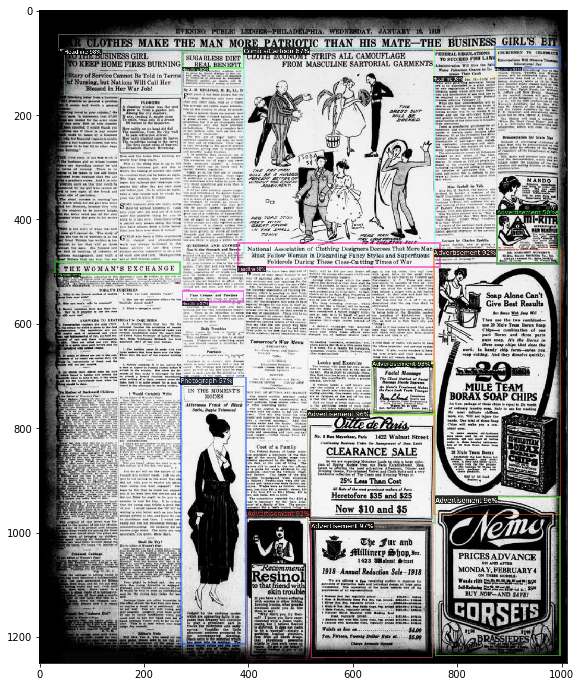

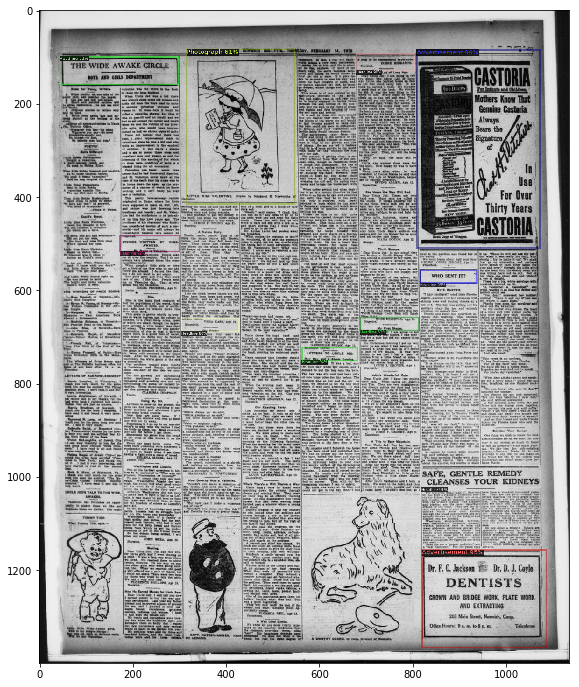

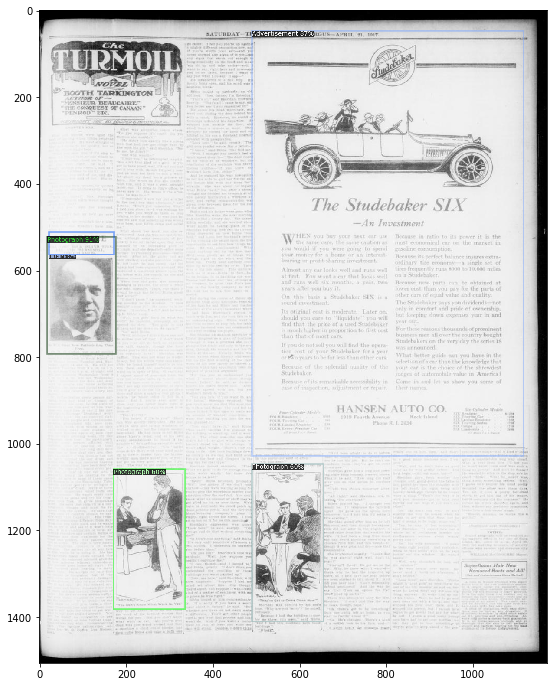

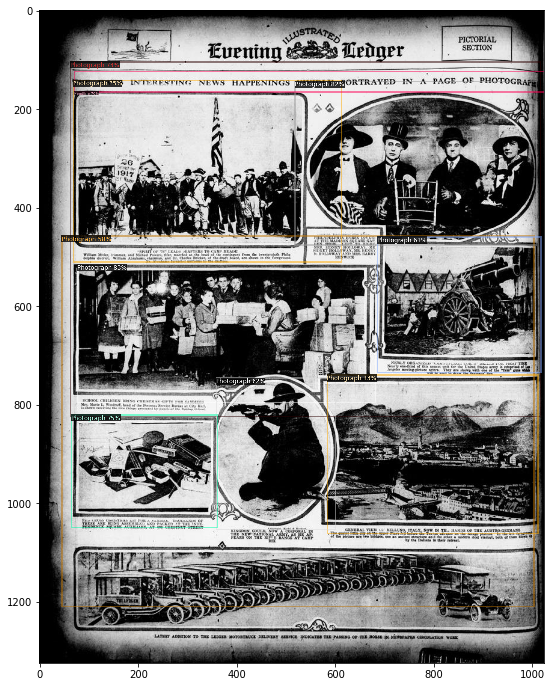

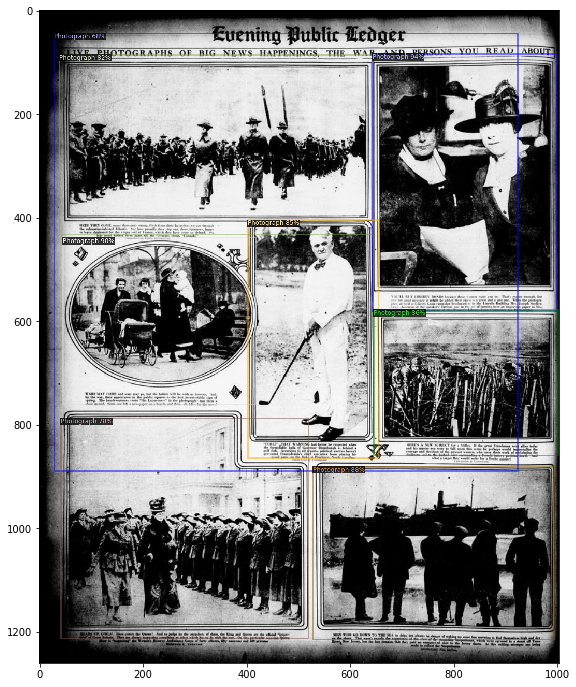

...

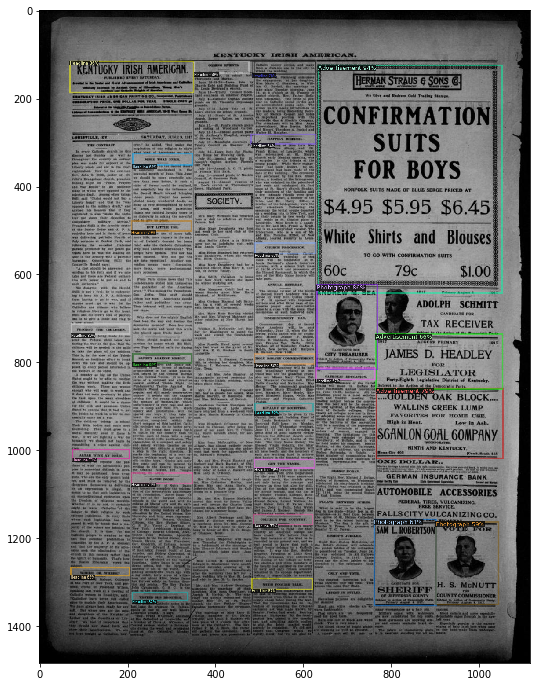

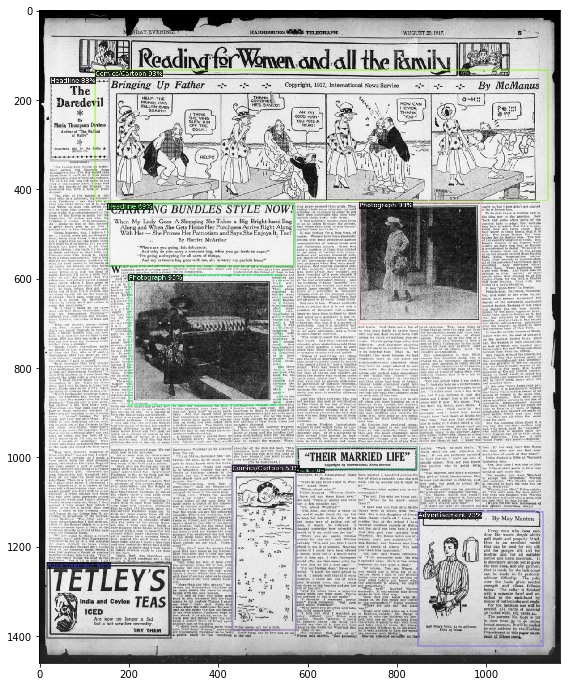

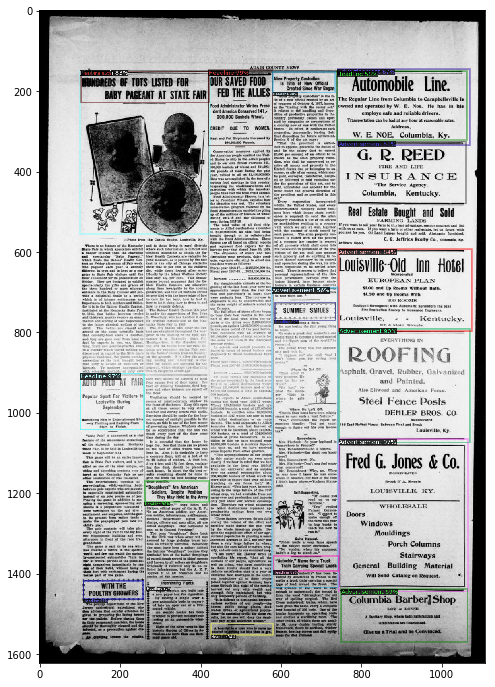

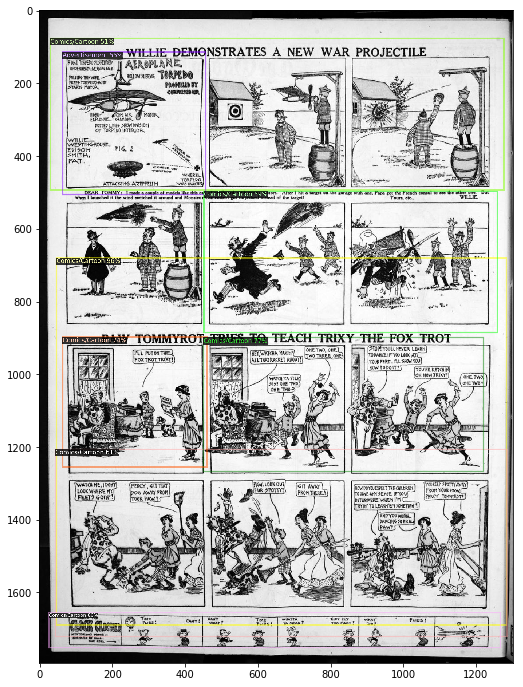

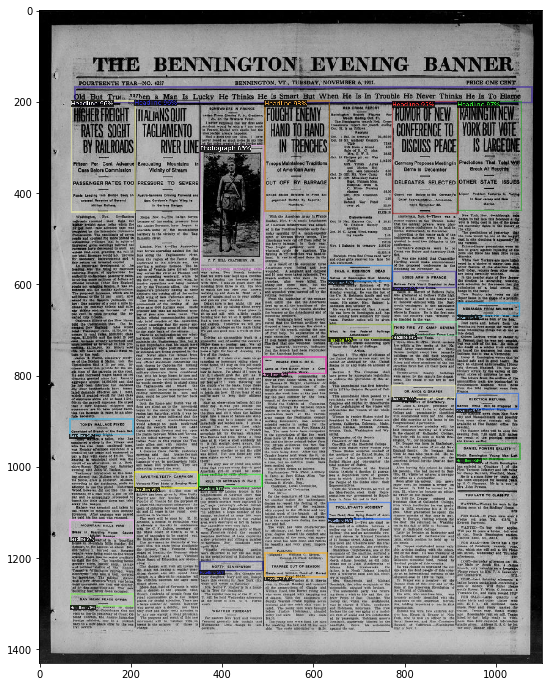

In [5]:
n_test_to_display = 20

for d in random.sample(DatasetCatalog.get("beyond_words_val"), n_test_to_display):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=MetadataCatalog.get("beyond_words_val"), 
                   scale=1.2   )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    #v = v.draw_dataset_dict(d)
    plt.figure(figsize=(15,12))
    plt.imshow(v.get_image()[:, :, ::-1])
    
    # if we want to save the images:
    # cv2.imwrite(filepath_here, v.get_image()[:, :, ::-1])
